# 
Task 1 - Data Analysis and Preprocessing
Load and Explore the Data

* Import required libraries
* loading the dataset
* Understand the data features

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os, sys
# Add the 'scripts' directory to the Python path for module imports
sys.path.append(os.path.abspath(os.path.join('..', 'scripts')))

# Set max rows and columns to display
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

# Configure logging
from logger import SetupLogger
# Assuming this class is defined in scripts/
from data_preprocessor import DataPreprocessor  

logger = SetupLogger(log_file='../logs/notebooks.log').get_logger()

In [2]:
# Initialize the DataPreprocessor with the logger and the path to the dataset
data_preprocessor = DataPreprocessor(filepath='../data/Fraud_Data.csv', logger=logger)

In [3]:
# Load the dataset
fraud_df = data_preprocessor.load_dataset()

In [4]:
# First 5 rows of the dataset
fraud_df.head(5)

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,7.327584e+08,0
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,3.503114e+08,0
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,2.621474e+09,1
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,3.840542e+09,0
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,4.155831e+08,0


In [5]:
# Dataset Information
fraud_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151112 entries, 0 to 151111
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   user_id         151112 non-null  int64  
 1   signup_time     151112 non-null  object 
 2   purchase_time   151112 non-null  object 
 3   purchase_value  151112 non-null  int64  
 4   device_id       151112 non-null  object 
 5   source          151112 non-null  object 
 6   browser         151112 non-null  object 
 7   sex             151112 non-null  object 
 8   age             151112 non-null  int64  
 9   ip_address      151112 non-null  float64
 10  class           151112 non-null  int64  
dtypes: float64(1), int64(4), object(6)
memory usage: 12.7+ MB


In [6]:
# Check for missing values in the dataset
missing_values = fraud_df.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values)

# Confirm if there are any missing values
if missing_values.sum() == 0:
    print("No missing values found in the dataset.")
else:
    print(f"There are {missing_values.sum()} missing values in the dataset.")

Missing Values in Each Column:
user_id           0
signup_time       0
purchase_time     0
purchase_value    0
device_id         0
source            0
browser           0
sex               0
age               0
ip_address        0
class             0
dtype: int64
No missing values found in the dataset.


In [7]:
# Convert 'signup_time' and 'purchase_time' to datetime format
fraud_df['signup_time'] = pd.to_datetime(fraud_df['signup_time'], errors='coerce')
fraud_df['purchase_time'] = pd.to_datetime(fraud_df['purchase_time'], errors='coerce')

# Verify the data types after conversion
print("Data Types After Conversion:")
print(fraud_df.dtypes)

Data Types After Conversion:
user_id                    int64
signup_time       datetime64[ns]
purchase_time     datetime64[ns]
purchase_value             int64
device_id                 object
source                    object
browser                   object
sex                       object
age                        int64
ip_address               float64
class                      int64
dtype: object


In [8]:

# Check for duplicate rows in the DataFrame
duplicate_count = fraud_df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

if duplicate_count:
    fraud_df.drop_duplicates(inplace=True)

Number of duplicate rows: 0


In [9]:
# Summary Statistics of numerical features
fraud_df.describe(include='number')

,user_id,purchase_value,age,ip_address,class
count,151112.000000,151112.000000,151112.000000,1.511120e+05,151112.000000
mean,200171.040970,36.935372,33.140704,2.152145e+09,0.093646
std,115369.285024,18.322762,8.617733,1.248497e+09,0.291336
min,2.000000,9.000000,18.000000,5.209350e+04,0.000000
25%,100642.500000,22.000000,27.000000,1.085934e+09,0.000000
50%,199958.000000,35.000000,33.000000,2.154770e+09,0.000000
75%,300054.000000,49.000000,39.000000,3.243258e+09,0.000000
max,400000.000000,154.000000,76.000000,4.294850e+09,1.000000


In [10]:

# Statistical summary of object data features
fraud_df.describe(include='object')

,device_id,source,browser,sex
count,151112,151112,151112,151112
unique,137956,3,5,2
top,NGQCKIADMZORL,SEO,Chrome,M
freq,20,60615,61432,88293


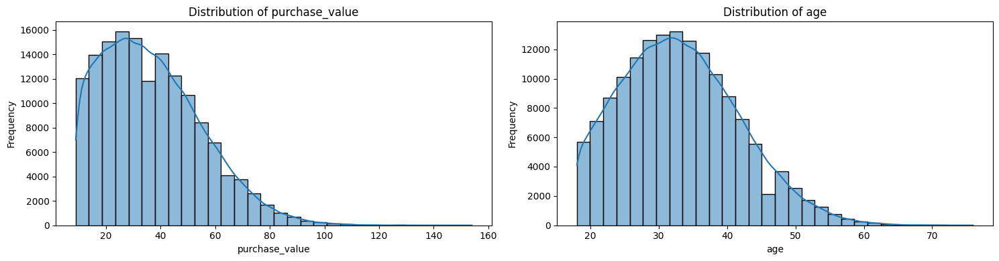

In [11]:
# Import data visualizer tool
from data_visualizer import DataVisualizer

# Define numerical features
numerical_features = ['purchase_value', 'age']

# Define categorical features
categorical_features = ['source', 'browser', 'sex']

# Create instance of the DataVisualizer(df, target_col)
visualizer = DataVisualizer(fraud_df, numerical_features, categorical_features, 'class', logger)


visualizer._plot_histograms()  # To plot histograms

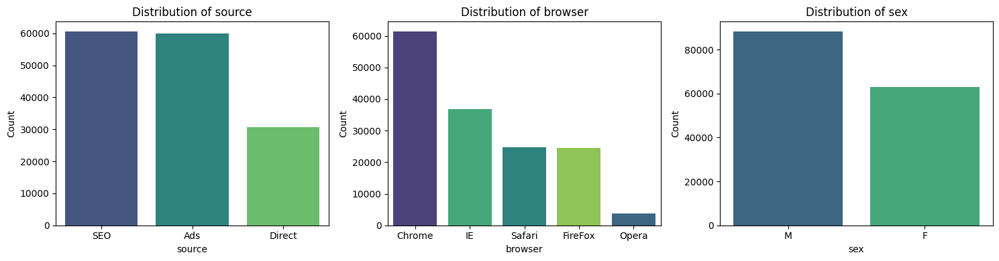

In [12]:
# Visualize the distribution
visualizer._plot_counts() # To plot counts for categorical features

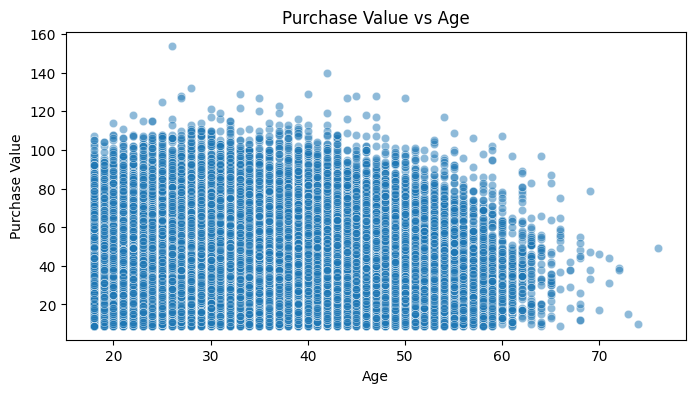

In [13]:
# Plot relationship between purchase_value vs age
visualizer.plot_relationship()

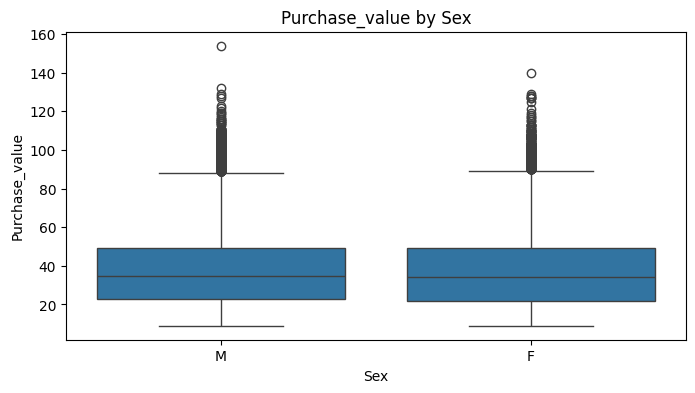

In [14]:
# Boxplot for purchase_value by sex
visualizer._boxplot('sex', 'purchase_value')

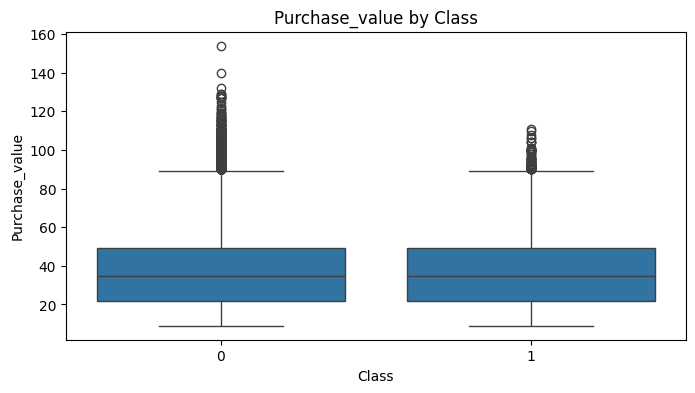

In [15]:
# Boxplot for purchase_value grouped by class
visualizer._boxplot('class', 'purchase_value')

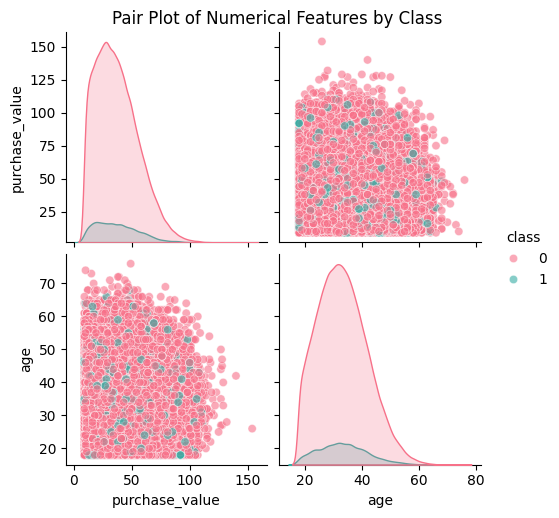

In [16]:
# Pairwise relationship
visualizer.plot_pairwise_relationships()

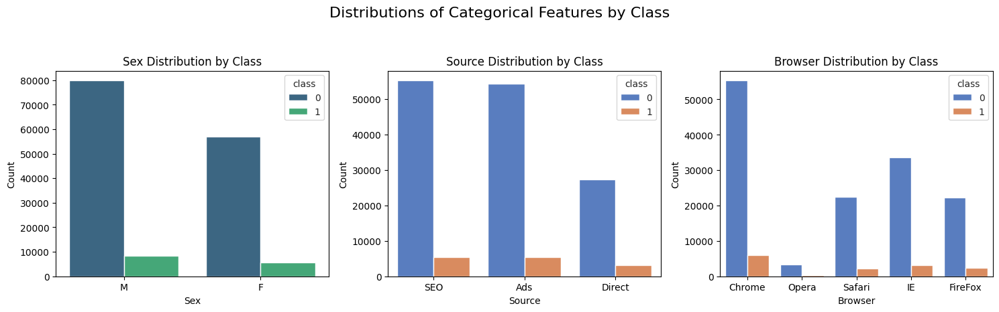

In [17]:

# plot the distribution of categorical feature variables by target variable
visualizer.plot_distribution_by_class()

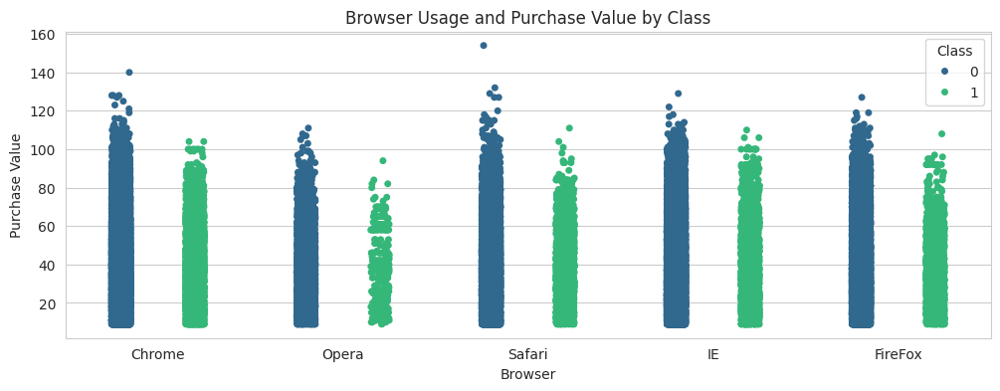

In [18]:
# Browser usage and Purchase value distribution by target variable
visualizer.plot_browser_usage()

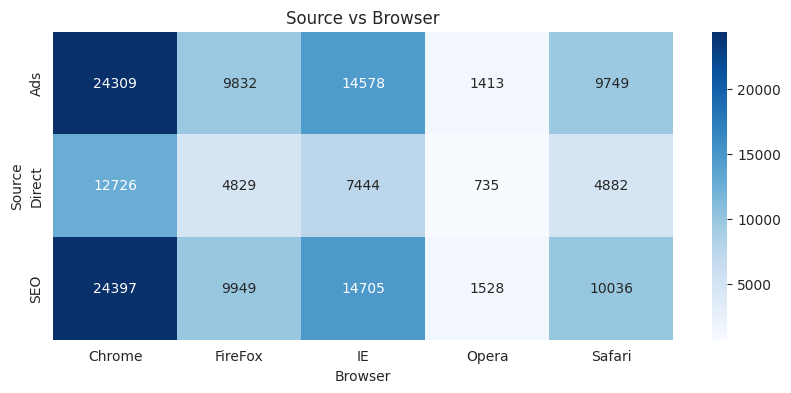

In [19]:

# Cross-tabulation and heatmap for source and browser
visualizer.plot_source_vs_browser_heatmap()

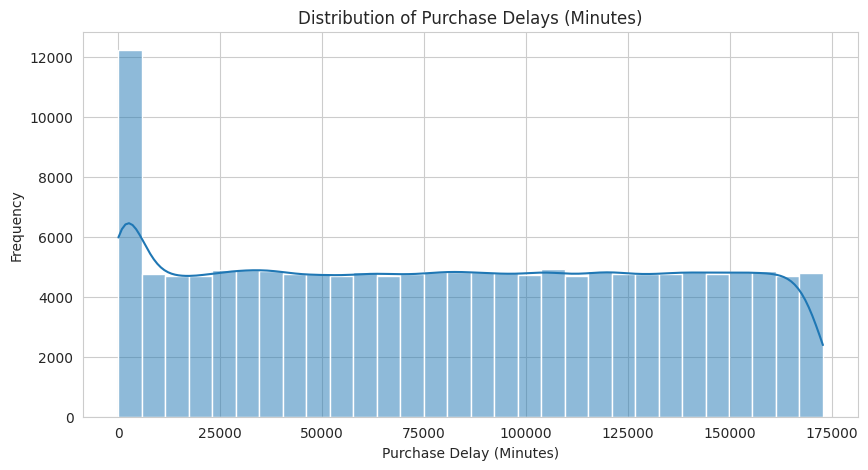

In [20]:


visualizer.plot_purchase_delay_distribution()

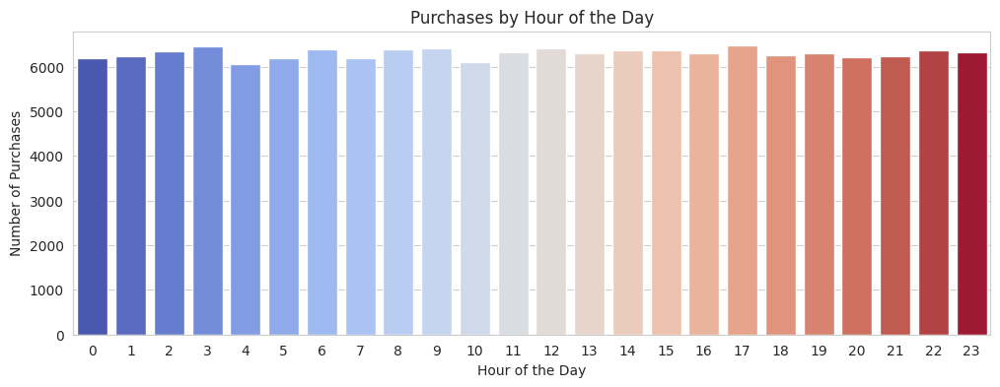

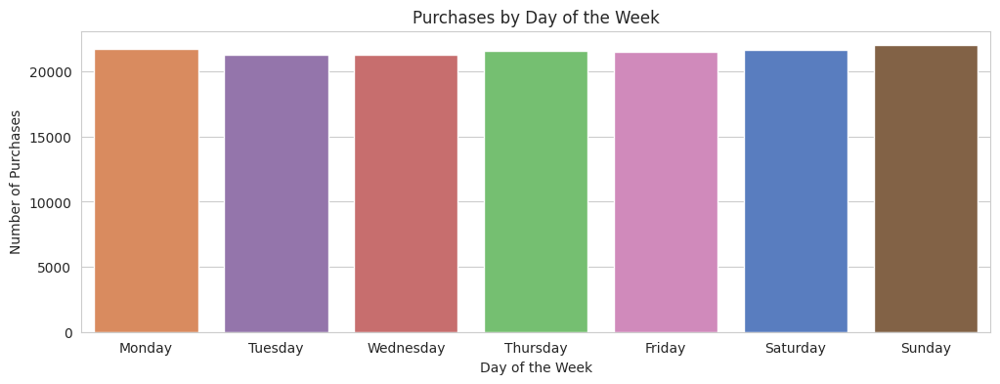

In [21]:

visualizer.plot_purchase_patterns_over_time()

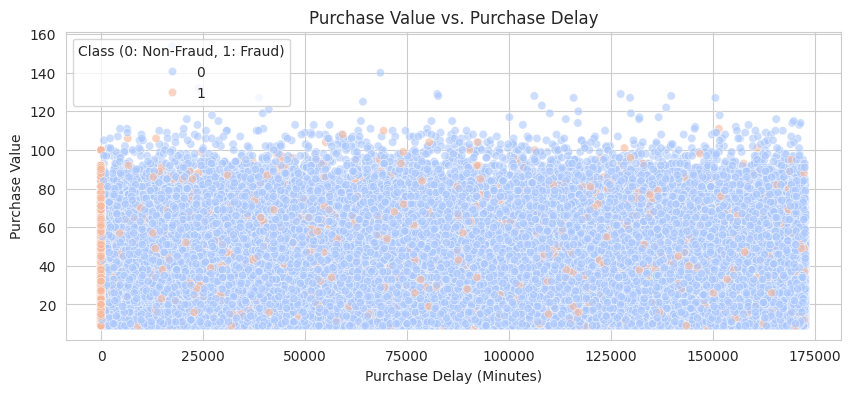

In [22]:
visualizer.plot_purchase_value_vs_delay()

#  Geolocation Analysis

In [23]:
import pandas as pd
import socket
import struct

def ip_to_int(ip):
    """Convert an IP address to its integer representation."""
    try:
        return struct.unpack("!I", socket.inet_aton(ip))[0]
    except socket.error:
        return None  # Handle invalid IPs gracefully

# Load the datasets
fraud_data = fraud_df.copy()
ip_country_data = pd.read_csv('../data/IpAddress_to_Country.csv')

# Convert IP addresses in fraud data to integer format
fraud_data['ip_int'] = fraud_data['ip_address'].apply(lambda x: ip_to_int(str(int(x))) if not pd.isna(x) else None)

# Drop rows with invalid IPs
fraud_data.dropna(subset=['ip_int'], inplace=True)

# Convert bounds in the country data to integer
ip_country_data['lower_bound_ip_address'] = ip_country_data['lower_bound_ip_address'].astype(int)
ip_country_data['upper_bound_ip_address'] = ip_country_data['upper_bound_ip_address'].astype(int)

# Sort both datasets for merge_asof
fraud_data.sort_values('ip_int', inplace=True)
ip_country_data.sort_values('lower_bound_ip_address', inplace=True)

# Merge the datasets using merge_asof
merged_data = pd.merge_asof(
    fraud_data,
    ip_country_data,
    left_on='ip_int',
    right_on='lower_bound_ip_address',
    direction='backward'
)

# Filter rows where ip_int is within the lower and upper bounds
merged_data = merged_data[(merged_data['ip_int'] >= merged_data['lower_bound_ip_address']) &
                          (merged_data['ip_int'] <= merged_data['upper_bound_ip_address'])]

# Drop unnecessary columns
merged_data.drop(columns=['lower_bound_ip_address', 'upper_bound_ip_address'], inplace=True)

# OPTIONAL: Save to csv file
merged_data.to_csv('../data/merged_fraud_data.csv')
# Display the first few rows of the merged dataset with country information
merged_data.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,purchase_delay,hour_of_day,day_of_week,ip_int,country
634,247547,2015-06-28 03:00:34,2015-08-09 03:57:29,47,KIXYSVCHIPQBR,SEO,Safari,F,30,1.677886e+07,0,60536.916667,3,Sunday,16778864,Australia
635,220737,2015-01-28 14:21:11,2015-02-11 20:28:28,15,PKYOWQKWGJNJI,SEO,Chrome,F,34,1.684205e+07,0,20527.283333,20,Wednesday,16842045,Thailand
636,390400,2015-03-19 20:49:09,2015-04-11 23:41:23,44,LVCSXLISZHVUO,Ads,IE,M,29,1.684366e+07,0,33292.233333,23,Saturday,16843656,China
637,69592,2015-02-24 06:11:57,2015-05-23 16:40:14,55,UHAUHNXXUADJE,Direct,Chrome,F,30,1.693873e+07,0,127348.283333,16,Saturday,16938732,China
638,174987,2015-07-07 12:58:11,2015-11-03 04:04:30,51,XPGPMOHIDRMGE,SEO,Chrome,F,37,1.697198e+07,0,170826.316667,4,Tuesday,16971984,Thailand


<Figure size 1400x700 with 0 Axes>

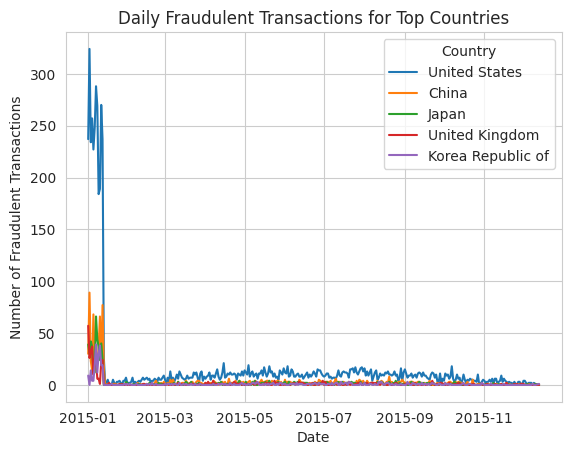

In [24]:
# Convert 'purchase_time' to datetime format
merged_data['purchase_time'] = pd.to_datetime(merged_data['purchase_time'])

# Group fraudulent transactions by day and country
daily_fraud = merged_data[merged_data['class'] == 1].groupby([merged_data['purchase_time'].dt.date, 'country']).size().unstack().fillna(0)

# Determine the top countries with the highest number of fraudulent transactions
top_countries = daily_fraud.sum().nlargest(5).index

# Plotting fraud trends over time for the top countries
plt.figure(figsize=(14, 7))
daily_fraud[top_countries].plot()
plt.title('Daily Fraudulent Transactions for Top Countries')
plt.xlabel('Date')
plt.ylabel('Number of Fraudulent Transactions')
plt.legend(title='Country')
plt.show()

In [25]:
import geopandas as gpd
# Step 1: Import the class
from geolocation_analyzer import GeolocationAnalyzer  # Assuming your class is saved in geolocation_analysis.py

# Step 2: Initialize the class with file paths
fraud_data_path = '../data/merged_fraud_data.csv'
world_data_path = '../data/ne_110m_admin_0_countries.shp'

# Load your data as DataFrames
fraud_data = pd.read_csv(fraud_data_path)
world_data = gpd.read_file(world_data_path)
world_data.rename(columns={'name': 'NAME'}, inplace=True)

# Initialize the class with DataFrames and the logger
geo_analyzer = GeolocationAnalyzer(fraud_df=fraud_data, 
                                   world_gdf=world_data, 
                                   logger=logger)


#geo_analyzer.analyze()

In [ ]:
# Calculate total transaction volumes by country
highestTranscation = geo_analyzer.calculate_transaction_volume()

highestTranscation.sort_values(by='transaction_volume', ascending=False).head(10)

,country,transaction_volume
0,United States,58049
1,China,12038
2,Japan,7306
3,United Kingdom,4490
4,Korea Republic of,4162
5,Germany,3646
6,France,3161
7,Canada,2975
8,Brazil,2961
9,Italy,1944


In [27]:
# Visualize the transaction volume in each contry in the world
# For transaction volume map
geo_analyzer.plot_transaction_volume_map()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'coloraxis': 'coloraxis',
              'customdata': {'bdata': ('AAAAAAAAGECz0ugRFWSrPwAAAAAAAD' ... 'AAAAAAAAAAAAAAAAAYQJGmDwqrW6Y/'),
                             'dtype': 'f8',
                             'shape': '177, 2'},
              'geo': 'geo',
              'geojson': {'bbox': (-179.99999999999997, -90.00000000000003,
                                   180.00000000000003, 83.64513000000001),
                          'features': [{'bbox': (60.52842980331158,
                                                 29.31857249604431,
                                                 75.15802778514092,
                                                 38.486281643216415),
                                        'geometry': {'coordinates': (((61.21081709
                                                                     1725744, 35.65
                                                                     0072333309225)
                                                                     , (62.23065148
                                                                     3005886, 35.27
                                                                     0663967422294)
                                                                     , (62.98466230
                                                                     657661, 35.404
                                                                     04083916762), 
                                                                     (63.1935384459
                                                                     0035, 35.85716
                                                                     5635718914), (
                                                                     63.98289594915
                                                                     871, 36.007957
                                                                     4651466), (64.
                                                                     5464791197339,
                                                                     36.31207326918
                                                                     427), (64.7461
                                                                     051776774, 37.
                                                                     11181773533330
                                                                     4), (65.588947
                                                                     78835784, 37.3
                                                                     0521678318564)
                                                                     , (65.74563073
                                                                     106683, 37.661
                                                                     16404881207), 
                                                                     (66.2173848814
                                                                     5934, 37.39379
                                                                     018813392), (6
                                                                     6.518606805288
                                                                     67, 37.3627843
                                                                     2875879), (67.
                                                                     07578209825962
                                                                     , 37.356143907
                                                                     20929), (67.82
                                                                     999962755952, 
                                                                     37.14499400486
                                                                     4685), (68.135
                                                                     56237170138, 3
                   

In [28]:
# Calculate total and fraudulent transactions by country
fraude_rate = geo_analyzer.calculate_fraud_rate()
fraude_rate.sort_values(by='fraud_rate', ascending=False).head(10)

,country,fraud_rate
166,Guadeloupe,1.000000
115,Albania,0.434783
154,Saint Kitts and Nevis,0.419355
98,Malta,0.388889
177,Gambia,0.333333
51,Philippines,0.264151
164,Cape Verde,0.262712
131,Mongolia,0.260504
20,Poland,0.245283
89,Sudan,0.233333


In [29]:
# Visualize the fraudelents countires in the world
# Save the fraud rate map as a static image
# For fraud rate map
geo_analyzer.plot_fraud_rate_map()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'coloraxis': 'coloraxis',
              'customdata': {'bdata': ('s9LoERVkqz8AAAAAAAAYQAAAAAAAAA' ... 'AAAAAAJECRpg8Kq1umPwAAAAAAABhA'),
                             'dtype': 'f8',
                             'shape': '177, 2'},
              'geo': 'geo',
              'geojson': {'bbox': (-179.99999999999997, -90.00000000000003,
                                   180.00000000000003, 83.64513000000001),
                          'features': [{'bbox': (60.52842980331158,
                                                 29.31857249604431,
                                                 75.15802778514092,
                                                 38.486281643216415),
                                        'geometry': {'coordinates': (((61.21081709
                                                                     1725744, 35.65
                                                                     0072333309225)
                                                                     , (62.23065148
                                                                     3005886, 35.27
                                                                     0663967422294)
                                                                     , (62.98466230
                                                                     657661, 35.404
                                                                     04083916762), 
                                                                     (63.1935384459
                                                                     0035, 35.85716
                                                                     5635718914), (
                                                                     63.98289594915
                                                                     871, 36.007957
                                                                     4651466), (64.
                                                                     5464791197339,
                                                                     36.31207326918
                                                                     427), (64.7461
                                                                     051776774, 37.
                                                                     11181773533330
                                                                     4), (65.588947
                                                                     78835784, 37.3
                                                                     0521678318564)
                                                                     , (65.74563073
                                                                     106683, 37.661
                                                                     16404881207), 
                                                                     (66.2173848814
                                                                     5934, 37.39379
                                                                     018813392), (6
                                                                     6.518606805288
                                                                     67, 37.3627843
                                                                     2875879), (67.
                                                                     07578209825962
                                                                     , 37.356143907
                                                                     20929), (67.82
                                                                     999962755952, 
                                                                     37.14499400486
                                                                     4685), (68.135
                                                                     56237170138, 3
                   

Short Summary:

Significant Fraud Concentration: Madagascar has an alarming 100% fraud rate, indicating all recorded transactions are fraudulent, which may signal critical vulnerabilities in transaction security or monitoring.

Regional Patterns of Concern: Countries like Albania (43.48%), Gibraltar (41.94%), and Trinidad and Tobago (38.89%) exhibit high fraud rates, suggesting systemic issues that require urgent attention and improved security measures.

Need for Enhanced Security: Nations such as the Philippines (26.42%), Vanuatu (26.27%), and Afghanistan (26.05%) show substantial fraud rates, highlighting the necessity for strengthened digital security infrastructure and proactive fraud detection strategies.

Feature Engineering
Features extracted from Fraud_Data.csv

Transaction frequency and velocity

Device transaction frequency

Time-Based features

hour_of _day
day_of_week
purchase_delay
Normalization and Scaling

Encode Categorical Features

Feature Engineering
Features extracted from Fraud_Data.csv

Transaction frequency and velocity

Device transaction frequency

Time-Based features

hour_of _day
day_of_week
purchase_delay
Normalization and Scaling

Encode Categorical Features

In [30]:
# Import the class
from feature_engineering import FeatureEngineering

# Step 1: Initialize the class with the DataFrame
feature_engineering = FeatureEngineering(fraud_df, logger)

# Step 2: Run the pipeline to process the data
feature_engineering.pipeline()

# Step 3: Retrieve the processed DataFrame
processed_data = feature_engineering.get_processed_data()

# View the processed data
display(processed_data.head())

,purchase_value,age,class,purchase_delay,hour_of_day,day_of_week,user_transaction_frequency,device_transaction_frequency,user_transaction_velocity,source_Direct,source_SEO,browser_FireFox,browser_IE,browser_Opera,browser_Safari,sex_M
user_id,,,,,,,,,,,,,,,,
22058,-0.160204,0.679914,0,-0.136057,-1.377455,0.991020,0.0,-0.261514,-0.230128,0.0,1.0,0.0,0.0,0.0,0.0,1.0
333320,-1.142592,2.304476,0,-1.571877,-1.522122,-1.501259,0.0,-0.261514,-0.229874,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1359,-1.197169,2.304476,1,-1.577617,0.937208,-0.005891,0.0,3.941861,4.345476,0.0,1.0,0.0,0.0,1.0,0.0,1.0
150084,0.385567,0.911994,0,-1.420213,0.213876,-1.501259,0.0,-0.261514,-0.230120,0.0,1.0,0.0,0.0,0.0,1.0,1.0
221365,0.112681,1.376155,0,-0.182509,0.937208,-0.504347,0.0,-0.261514,-0.230128,0.0,0.0,0.0,0.0,0.0,1.0,1.0


In [31]:
# Save the processed datase to the csv for modeling
processed_data.to_csv('../data/processed_fraud_data.csv')